In [1]:
# Importing required libraries and suppressing warnings
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib
matplotlib.use('Agg')  # use Agg backend for matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set(style='whitegrid', palette='muted', font_scale=1.2)



In [4]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.inspection import permutation_importance

In [7]:
# Load datasetdrivers = pd.read_csv("drivers.csv")
path = r"C:\Users\Admin\Desktop\data set\archive"

drivers = pd.read_csv(path + r"\drivers.csv")
trips = pd.read_csv(path + r"\trips.csv")
driver_monthly = pd.read_csv(path + r"\driver_monthly_metrics.csv")



In [8]:
## conver date columns to datetime format
driver_monthly['month'] = pd.to_datetime(driver_monthly['month'], errors='coerce')
trips['dispatch_date'] = pd.to_datetime(trips['dispatch_date'], errors='coerce')

trips['month'] = trips['dispatch_date'].dt.to_period("M").dt.to_timestamp()


Aggregate TRIPS into monthly metrics

Even though driver_monthly already contains some metrics, we MUST add more features from trips:

In [9]:
trip_monthly = trips.groupby(['driver_id','month']).agg(
    total_miles=('actual_distance_miles','sum'),
    total_hours=('actual_duration_hours','sum'),
    fuel_used=('fuel_gallons_used','sum'),
    avg_trip_mpg=('average_mpg','mean'),
    idle_time=('idle_time_hours','sum'),
    trip_count=('trip_id','count')
).reset_index()


In [10]:
## add derived monthly features 
trip_monthly['idle_ratio'] = trip_monthly['idle_time'] / trip_monthly['total_hours']
trip_monthly['productivity'] = trip_monthly['total_miles'] / trip_monthly['total_hours']
trip_monthly['fuel_efficiency'] = trip_monthly['total_miles'] / trip_monthly['fuel_used']


Prepare DRIVER PROFILE table

In [19]:
drivers['hire_date'] = pd.to_datetime(drivers['hire_date'], errors='coerce')
drivers['date_of_birth'] = pd.to_datetime(drivers['date_of_birth'], errors='coerce')

today = pd.Timestamp.today()

drivers['driver_age'] = (today - drivers['date_of_birth']).dt.days / 365
drivers['driver_tenure'] = (today - drivers['hire_date']).dt.days / 365


In [12]:
drivers_selected = drivers[['driver_id','home_terminal','cdl_class',
    'employment_status','years_experience','driver_age','driver_tenure']]


## joing everything

In [13]:
merged = driver_monthly.merge(trip_monthly, on=['driver_id','month'], how='left')


In [14]:
final = merged.merge(drivers_selected, on='driver_id', how='left')


In [15]:
print(final['on_time_delivery_rate'].head())


0    0.385
1    0.333
2    0.550
3    0.474
4    0.214
Name: on_time_delivery_rate, dtype: float64


In [16]:
final.to_csv("final_driver_monthly_metrics.csv", index=False)


In [ ]:
!pip install statsmodels

   ---------------------------------------- 0.0/9.6 MB ? eta -:--:--
   --------------------- ------------------ 5.2/9.6 MB 31.9 MB/s eta 0:00:01
   ---------------------------------------  9.4/9.6 MB 30.2 MB/s eta 0:00:01
   ---------------------------------------- 9.6/9.6 MB 25.1 MB/s  0:00:00

   ---------------------------------------- 0/2 [patsy]
   ---------------------------------------- 0/2 [patsy]
   ---------------------------------------- 0/2 [patsy]
   ---------------------------------------- 0/2 [patsy]
   -------------------- ------------------- 1/2 [statsmodels]
   -------------------- ------------------- 1/2 [statsmodels]
   -------------------- ------------------- 1/2 [statsmodels]
   -------------------- ------------------- 1/2 [statsmodels]
   -------------------- ------------------- 1/2 [statsmodels]
   -------------------- ------------------- 1/2 [statsmodels]
   -------------------- ------------------- 1/2 [statsmodels]
   -------------------- ------------------- 


[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
# Importing required libraries and suppressing warnings
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib
matplotlib.use('Agg')  # use Agg backend for matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set(style='whitegrid', palette='muted', font_scale=1.2)
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.inspection import permutation_importance


In [23]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm


In [4]:
data = pd.read_csv("final_driver_monthly_metrics.csv")

In [5]:
data.head()

,driver_id,month,trips_completed,total_miles_x,total_revenue,average_mpg,total_fuel_gallons,on_time_delivery_rate,average_idle_hours,total_miles_y,...,trip_count,idle_ratio,productivity,fuel_efficiency,home_terminal,cdl_class,employment_status,years_experience,driver_age,driver_tenure
0,DRV00001,2022-01-01,26,36620,79141.59,6.61,5574.7,0.385,8.2,36620,...,26,0.333126,56.978372,6.568963,Denver,A,Active,3,52.128767,11.120548
1,DRV00001,2022-02-01,9,13515,27133.87,6.69,2095.1,0.333,6.8,13515,...,9,0.250816,55.118271,6.450766,Denver,A,Active,3,52.128767,11.120548
2,DRV00001,2022-03-01,20,30361,62399.62,6.36,4792.2,0.550,7.5,30361,...,20,0.275887,55.545188,6.335504,Denver,A,Active,3,52.128767,11.120548
3,DRV00001,2022-04-01,19,28127,68161.13,6.61,4251.4,0.474,8.4,28127,...,19,0.319649,56.052212,6.615938,Denver,A,Active,3,52.128767,11.120548
4,DRV00001,2022-05-01,14,16071,36256.82,6.35,2573.1,0.214,6.8,16071,...,14,0.338647,56.928799,6.245774,Denver,A,Active,3,52.128767,11.120548


In [6]:
data.shape

(4464, 24)

In [7]:
## check for the null values 
data.isnull().sum()

driver_id                0
month                    0
trips_completed          0
total_miles_x            0
total_revenue            0
average_mpg              0
total_fuel_gallons       0
on_time_delivery_rate    0
average_idle_hours       0
total_miles_y            0
total_hours              0
fuel_used                0
avg_trip_mpg             0
idle_time                0
trip_count               0
idle_ratio               0
productivity             0
fuel_efficiency          0
home_terminal            0
cdl_class                0
employment_status        0
years_experience         0
driver_age               0
driver_tenure            0
dtype: int64

In [8]:
## check for the unique values 
data.nunique()

driver_id                 124
month                      36
trips_completed            32
total_miles_x            4100
total_revenue            4463
average_mpg                97
total_fuel_gallons       4201
on_time_delivery_rate     187
average_idle_hours         51
total_miles_y            4100
total_hours              2911
fuel_used                4208
avg_trip_mpg             3489
idle_time                1376
trip_count                 32
idle_ratio               4448
productivity             4459
fuel_efficiency          4464
home_terminal              25
cdl_class                   1
employment_status           1
years_experience           24
driver_age                122
driver_tenure             123
dtype: int64

In [9]:
## datatype 
data.dtypes

driver_id                 object
month                     object
trips_completed            int64
total_miles_x              int64
total_revenue            float64
average_mpg              float64
total_fuel_gallons       float64
on_time_delivery_rate    float64
average_idle_hours       float64
total_miles_y              int64
total_hours              float64
fuel_used                float64
avg_trip_mpg             float64
idle_time                float64
trip_count                 int64
idle_ratio               float64
productivity             float64
fuel_efficiency          float64
home_terminal             object
cdl_class                 object
employment_status         object
years_experience           int64
driver_age               float64
driver_tenure            float64
dtype: object

In [10]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
trips_completed,4464.0,18.749104,4.387080,5.000000,16.000000,19.000000,22.000000,37.000000
total_miles_x,4464.0,26812.792339,7253.534265,3310.000000,21783.000000,26409.500000,31474.750000,57954.000000
total_revenue,4464.0,57630.947713,15899.349196,7096.560000,46314.052500,56652.715000,67964.807500,124579.530000
average_mpg,4464.0,6.501862,0.140353,6.010000,6.410000,6.500000,6.600000,7.070000
total_fuel_gallons,4464.0,4158.631698,1132.037704,521.900000,3372.500000,4083.950000,4882.400000,9007.500000
on_time_delivery_rate,4464.0,0.445996,0.119988,0.000000,0.364000,0.444000,0.526000,0.833000
average_idle_hours,4464.0,7.011738,0.683257,4.400000,6.600000,7.000000,7.500000,9.700000
total_miles_y,4464.0,26812.792339,7253.534265,3310.000000,21783.000000,26409.500000,31474.750000,57954.000000
total_hours,4464.0,468.952128,126.918949,61.300000,381.000000,462.000000,550.425000,1004.700000
fuel_used,4464.0,4158.631698,1132.037704,521.900000,3372.500000,4083.950000,4882.400000,9007.500000


In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4464 entries, 0 to 4463
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   driver_id              4464 non-null   object 
 1   month                  4464 non-null   object 
 2   trips_completed        4464 non-null   int64  
 3   total_miles_x          4464 non-null   int64  
 4   total_revenue          4464 non-null   float64
 5   average_mpg            4464 non-null   float64
 6   total_fuel_gallons     4464 non-null   float64
 7   on_time_delivery_rate  4464 non-null   float64
 8   average_idle_hours     4464 non-null   float64
 9   total_miles_y          4464 non-null   int64  
 10  total_hours            4464 non-null   float64
 11  fuel_used              4464 non-null   float64
 12  avg_trip_mpg           4464 non-null   float64
 13  idle_time              4464 non-null   float64
 14  trip_count             4464 non-null   int64  
 15  idle

#### 1 — Univariate analysis

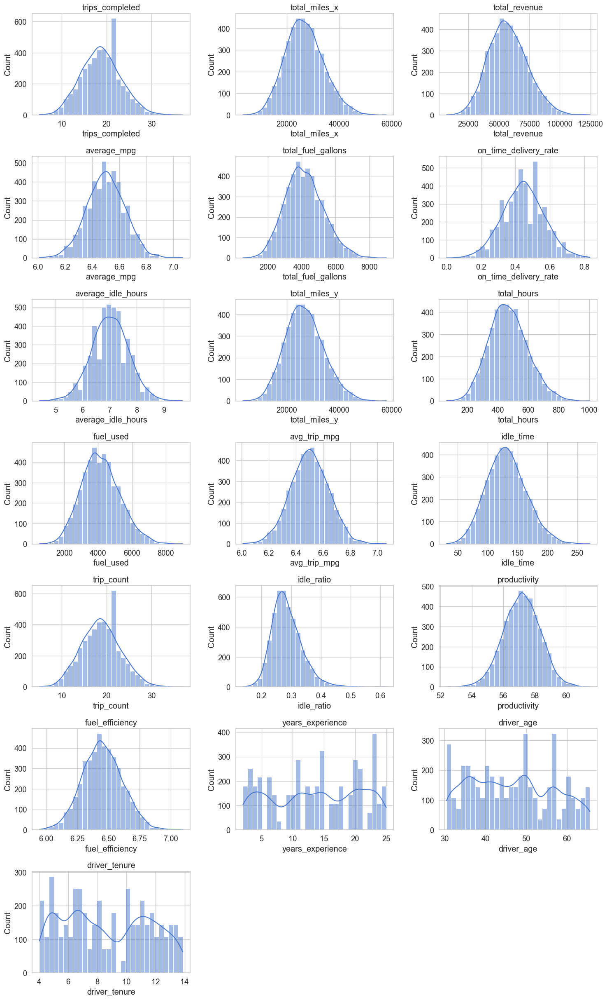

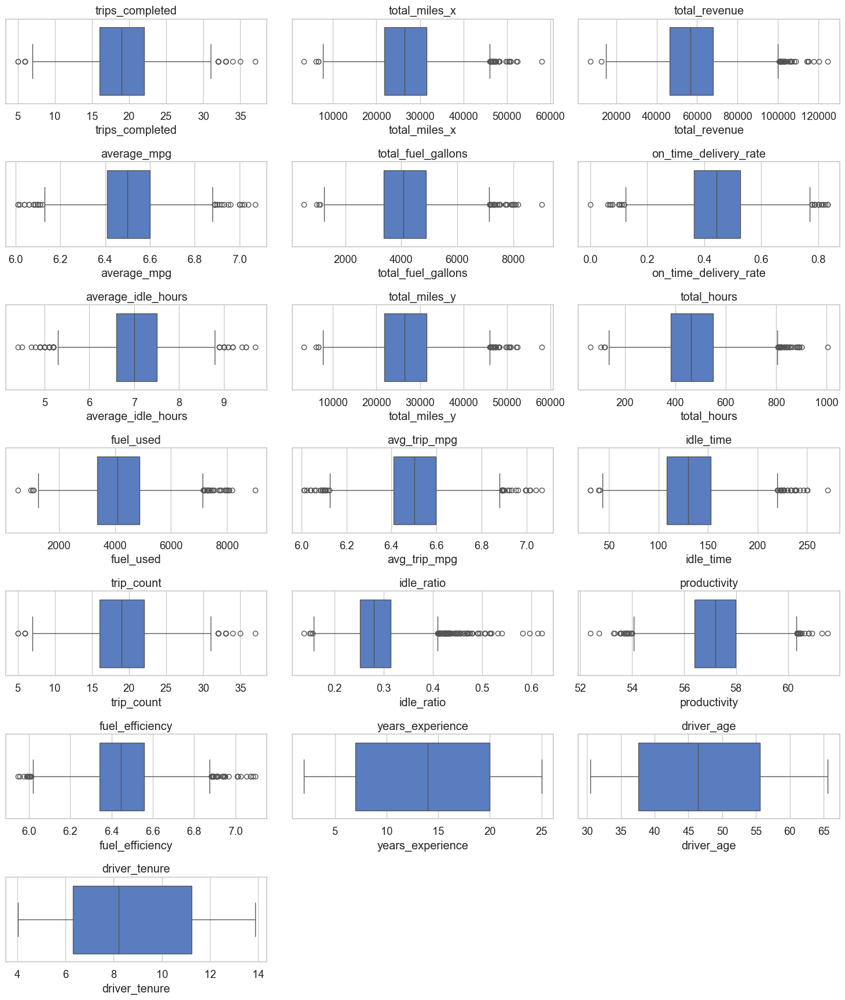

Categorical value counts (top 10 each):

-- driver_id --
driver_id
DRV00001    36
DRV00002    36
DRV00003    36
DRV00004    36
DRV00005    36
DRV00006    36
DRV00009    36
DRV00010    36
DRV00011    36
DRV00012    36
Name: count, dtype: int64

-- month --
month
2022-01-01    124
2022-02-01    124
2022-03-01    124
2022-04-01    124
2022-05-01    124
2022-06-01    124
2022-07-01    124
2022-08-01    124
2022-09-01    124
2022-10-01    124
Name: count, dtype: int64

-- home_terminal --
home_terminal
Dallas           324
Minneapolis      288
Las Vegas        288
New York         252
Oklahoma City    252
Seattle          216
Nashville        216
Columbus         216
Los Angeles      216
Atlanta          180
Name: count, dtype: int64

-- cdl_class --
cdl_class
A    4464
Name: count, dtype: int64

-- employment_status --
employment_status
Active    4464
Name: count, dtype: int64


In [29]:
# CELL 1: Univariate analysis (numeric summary + histograms + boxplots)
numeric_cols = data.select_dtypes(include=['int64','float64']).columns.tolist()
categorical_cols = data.select_dtypes(include=['object','category']).columns.tolist()

# Summary statistics
# print("Numeric summary:")
# display(data[numeric_cols].describe().T)

# Skewness and kurtosis
# skew_kurt = pd.DataFrame({
#    'skew': data[numeric_cols].skew(),
#    'kurtosis': data[numeric_cols].kurtosis(),
#    'n_missing': data[numeric_cols].isna().sum()
#}).sort_values('skew', ascending=False)
#display(skew_kurt)

# Histograms (plot in a grid)
n = len(numeric_cols)
cols = 3
rows = (n + cols - 1) // cols
plt.figure(figsize=(cols*5, rows*3.5))
for i, c in enumerate(numeric_cols):
    plt.subplot(rows, cols, i+1)
    sns.histplot(data[c].dropna(), kde=True, bins=30)
    plt.title(c)
plt.tight_layout()
plt.show()

# Boxplots for numeric columns (to inspect outliers)
plt.figure(figsize=(cols*5, rows*2.5))
for i, c in enumerate(numeric_cols):
    plt.subplot(rows, cols, i+1)
    sns.boxplot(x=data[c])
    plt.title(c)
plt.tight_layout()
plt.show()

# Categorical value counts (top categories)
print("Categorical value counts (top 10 each):")
for c in categorical_cols:
    print(f"\n-- {c} --")
    print(data[c].value_counts(dropna=False).head(10))


## treating the outlier 

In [30]:
# Select numeric columns (excluding target if needed)
num_cols = data.select_dtypes(include=['float64', 'int64']).columns

def cap_outliers_iqr(data, cols):
    data_clean = data.copy()
    
    for col in cols:
        Q1 = data_clean[col].quantile(0.25)
        Q3 = data_clean[col].quantile(0.75)
        IQR = Q3 - Q1
        
        lower_cap = Q1 - 1.5 * IQR
        upper_cap = Q3 + 1.5 * IQR
        
        # Apply capping (winsorization)
        data_clean[col] = data_clean[col].clip(lower=lower_cap, upper=upper_cap)
    
    return data_clean

# Apply outlier treatment
data = cap_outliers_iqr(data, num_cols)

data.head()


,driver_id,month,trips_completed,total_miles_x,total_revenue,average_mpg,total_fuel_gallons,on_time_delivery_rate,average_idle_hours,total_miles_y,...,trip_count,idle_ratio,productivity,fuel_efficiency,home_terminal,cdl_class,employment_status,years_experience,driver_age,driver_tenure
0,DRV00001,2022-01-01,26,36620.0,79141.59,6.61,5574.7,0.385,8.2,36620.0,...,26,0.333126,56.978372,6.568963,Denver,A,Active,3,52.128767,11.120548
1,DRV00001,2022-02-01,9,13515.0,27133.87,6.69,2095.1,0.333,6.8,13515.0,...,9,0.250816,55.118271,6.450766,Denver,A,Active,3,52.128767,11.120548
2,DRV00001,2022-03-01,20,30361.0,62399.62,6.36,4792.2,0.550,7.5,30361.0,...,20,0.275887,55.545188,6.335504,Denver,A,Active,3,52.128767,11.120548
3,DRV00001,2022-04-01,19,28127.0,68161.13,6.61,4251.4,0.474,8.4,28127.0,...,19,0.319649,56.052212,6.615938,Denver,A,Active,3,52.128767,11.120548
4,DRV00001,2022-05-01,14,16071.0,36256.82,6.35,2573.1,0.214,6.8,16071.0,...,14,0.338647,56.928799,6.245774,Denver,A,Active,3,52.128767,11.120548


### univareant analyses after the removing the outlier 

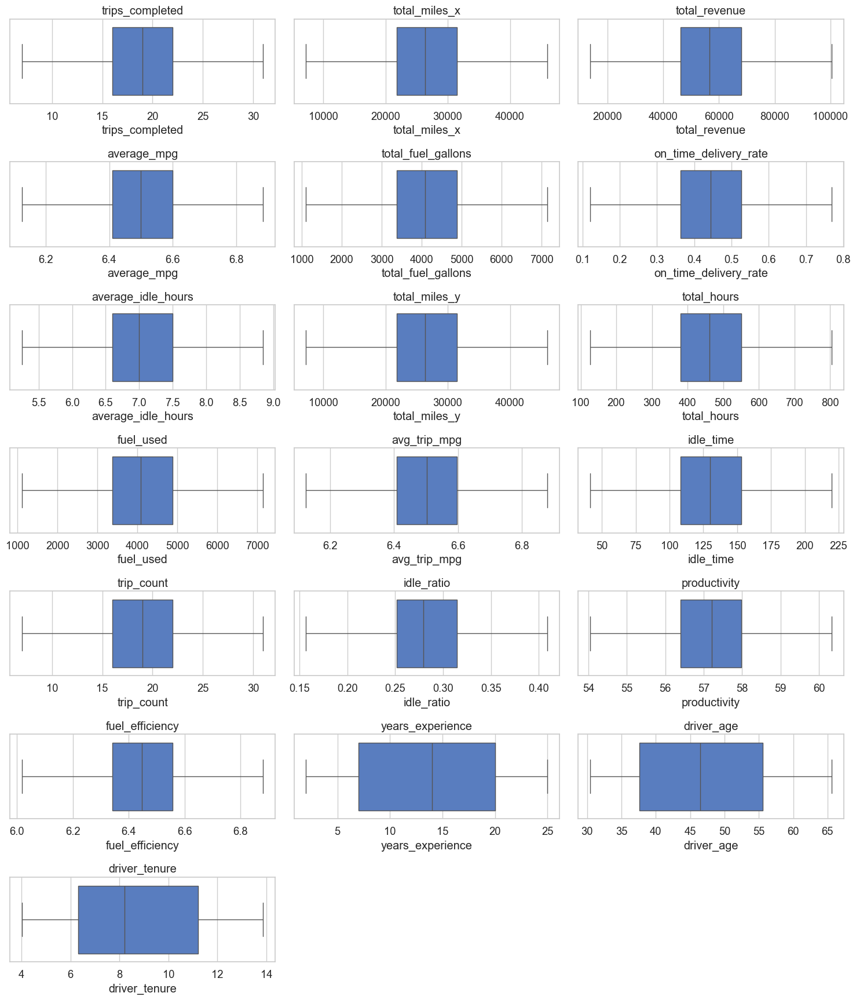

In [31]:
# Boxplots for numeric columns (to inspect outliers)
plt.figure(figsize=(cols*5, rows*2.5))
for i, c in enumerate(numeric_cols):
    plt.subplot(rows, cols, i+1)
    sns.boxplot(x=data[c])
    plt.title(c)
plt.tight_layout()
plt.show()

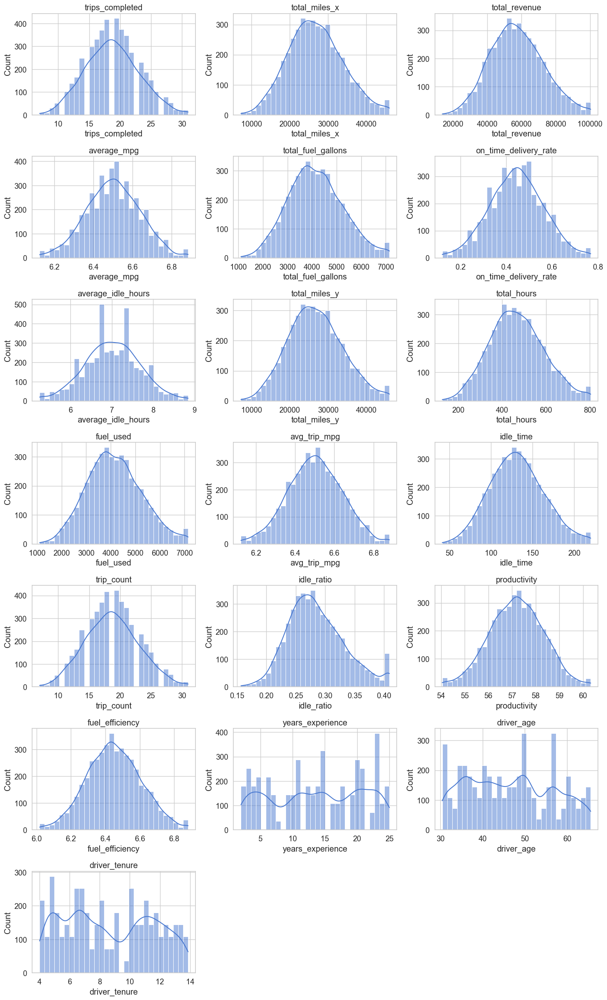

In [32]:
# Histograms (plot in a grid)
n = len(numeric_cols)
cols = 3
rows = (n + cols - 1) // cols
plt.figure(figsize=(cols*5, rows*3.5))
for i, c in enumerate(numeric_cols):
    plt.subplot(rows, cols, i+1)
    sns.histplot(data[c].dropna(), kde=True, bins=30)
    plt.title(c)
plt.tight_layout()
plt.show()

### 2 — Missingness analysis

In [36]:
# CELL 2: Missingness analysis (counts, percent, heatmap)
missing = pd.DataFrame({
    'n_missing': data.isna().sum(),
    'pct_missing': data.isna().mean() * 100
}).sort_values('pct_missing', ascending=False)
display(missing)



,n_missing,pct_missing
driver_id,0,0.0
month,0,0.0
trips_completed,0,0.0
total_miles_x,0,0.0
total_revenue,0,0.0
average_mpg,0,0.0
total_fuel_gallons,0,0.0
on_time_delivery_rate,0,0.0
average_idle_hours,0,0.0
total_miles_y,0,0.0


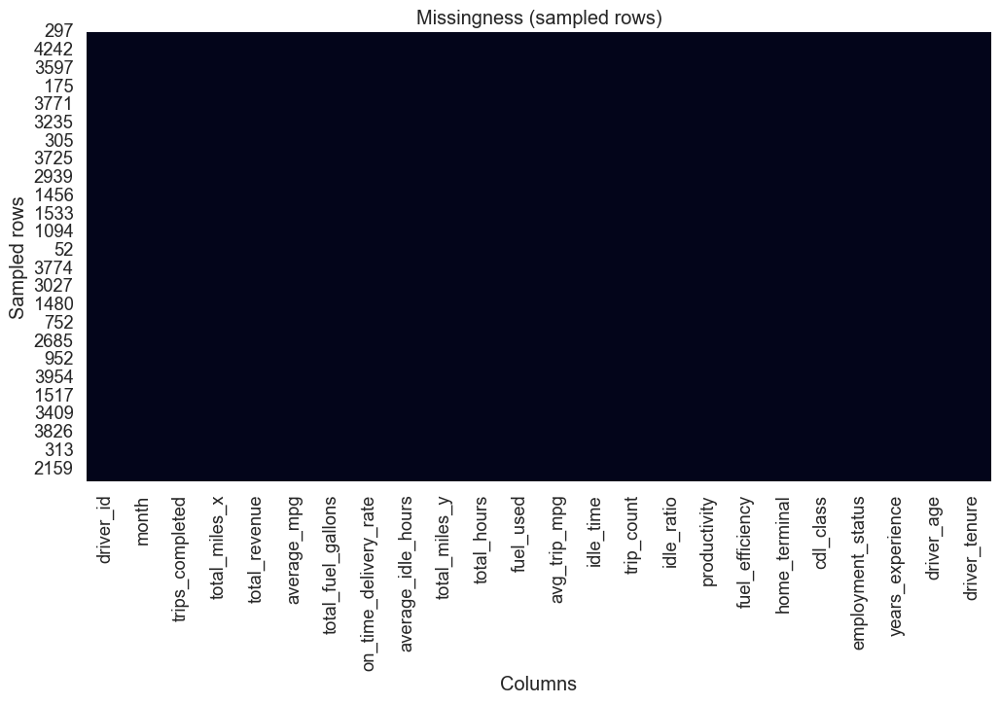

Columns with missing values:
Empty DataFrame
Columns: [n_missing, pct_missing]
Index: []


In [37]:
# Visual missingness heatmap (sample large df to speed up)
plt.figure(figsize=(12,6))
sample = data.sample(n=min(2000, len(data)), random_state=42)  # sample for big datasets
sns.heatmap(sample.isna(), cbar=False)
plt.title("Missingness (sampled rows)")
plt.xlabel("Columns")
plt.ylabel("Sampled rows")
plt.show()

# Show columns with any missing values
print("Columns with missing values:")
print(missing[missing['n_missing']>0])

### 3 — Target distribution (on_time_delivery_rate)

In [39]:
from scipy import stats


Target summary:


,count,mean,std,min,1%,5%,25%,50%,75%,95%,99%,max
on_time_delivery_rate,4464.0,0.445972,0.119321,0.121,0.167,0.25,0.364,0.444,0.526,0.643,0.733,0.769


Missing in target: 0


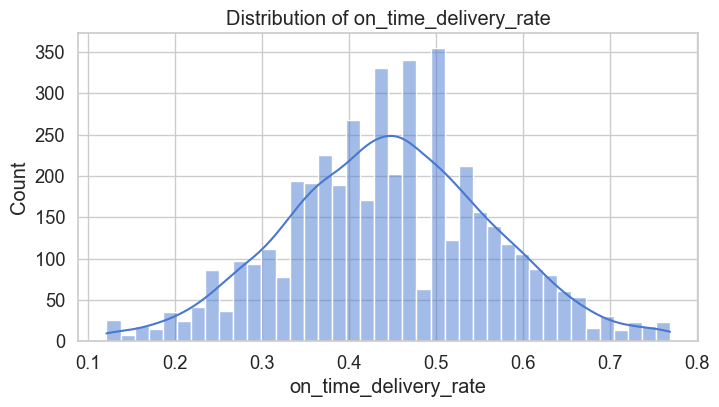

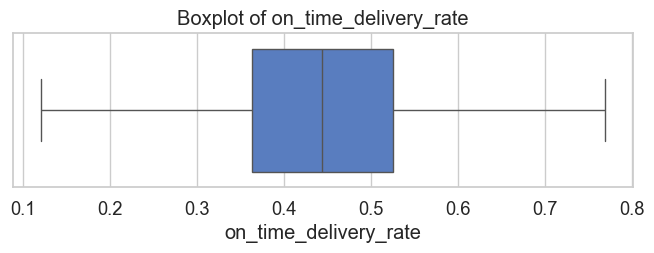

Sample size: 4464
Shapiro-Wilk test: stat=0.9978, p=0.0000

Target quantiles:
0.00    0.121
0.01    0.167
0.05    0.250
0.10    0.292
0.25    0.364
0.50    0.444
0.75    0.526
0.90    0.600
0.95    0.643
0.99    0.733
1.00    0.769
Name: on_time_delivery_rate, dtype: float64


In [ ]:
# Target distribution analysis
target = 'on_time_delivery_rate'  # change if different

if target not in data.columns:
    raise KeyError(f"Target column '{target}' not found in dataframe")

# Basic stats
print("Target summary:")
display(data[target].describe(percentiles=[0.01,0.05,0.25,0.5,0.75,0.95,0.99]).to_frame().T)
print("Missing in target:", data[target].isna().sum())

# Histogram + KDE
plt.figure(figsize=(8,4))
sns.histplot(data[target].dropna(), kde=True, bins=40)
plt.title(f"Distribution of {target}")
plt.xlabel(target)
plt.show()

# Boxplot
plt.figure(figsize=(8,2))
sns.boxplot(x=data[target].dropna())
plt.title(f"Boxplot of {target}")
plt.show()

# Normality tests (Shapiro for small n; D'Agostino for larger)
# n = data[target].dropna().shape[0]
# print("Sample size:", n)

# if n < 5000:
#    stat, p = stats.shapiro(data[target].dropna().sample(n=min(5000, n), random_state=42))
#    print("Shapiro-Wilk test: stat=%.4f, p=%.4f" % (stat, p))
#else:
#    stat, p = stats.normaltest(data[target].dropna().sample(n=5000, random_state=42))
#    print("D'Agostino test: stat=%.4f, p=%.4f" % (stat, p))

# Show quantile bins (useful for balancing experiments)
# print("\nTarget quantiles:")
# print(data[target].quantile([0,0.01,0.05,0.1,0.25,0.5,0.75,0.9,0.95,0.99,1.0]))


# 4 — Bivariate analysis (feature vs target)

### Bivariate Analysis: Target vs Numerical Features


Correlation of numerical features with target:


fuel_efficiency       0.024306
years_experience      0.022022
average_mpg           0.016887
avg_trip_mpg          0.016616
productivity          0.008181
trips_completed       0.007467
trip_count            0.007467
idle_time             0.006416
driver_tenure         0.005494
total_miles_x         0.005050
total_miles_y         0.005050
total_hours           0.004427
total_revenue         0.003813
total_fuel_gallons    0.002530
fuel_used             0.002530
idle_ratio            0.001353
average_idle_hours   -0.001643
driver_age           -0.005404
dtype: float64

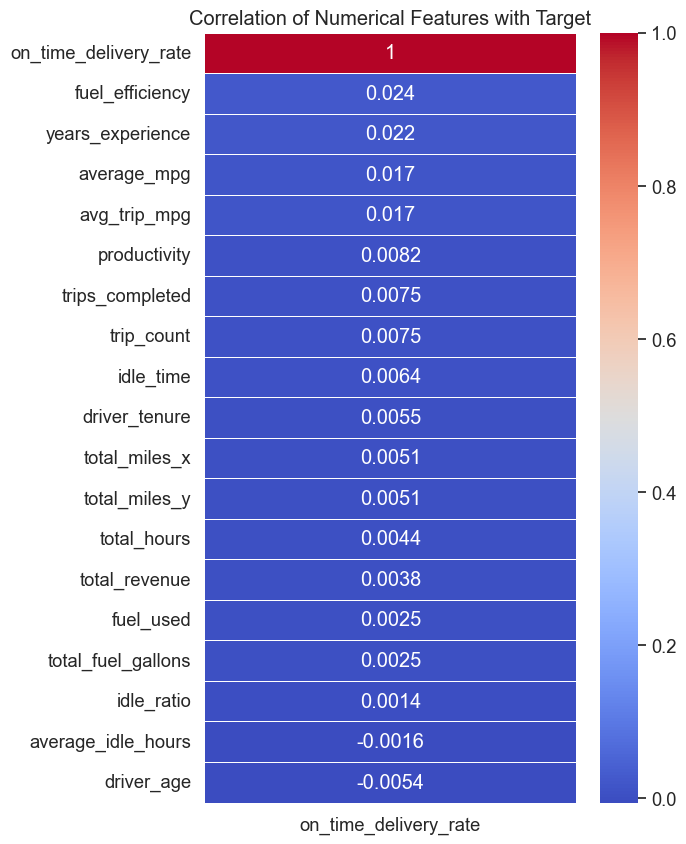

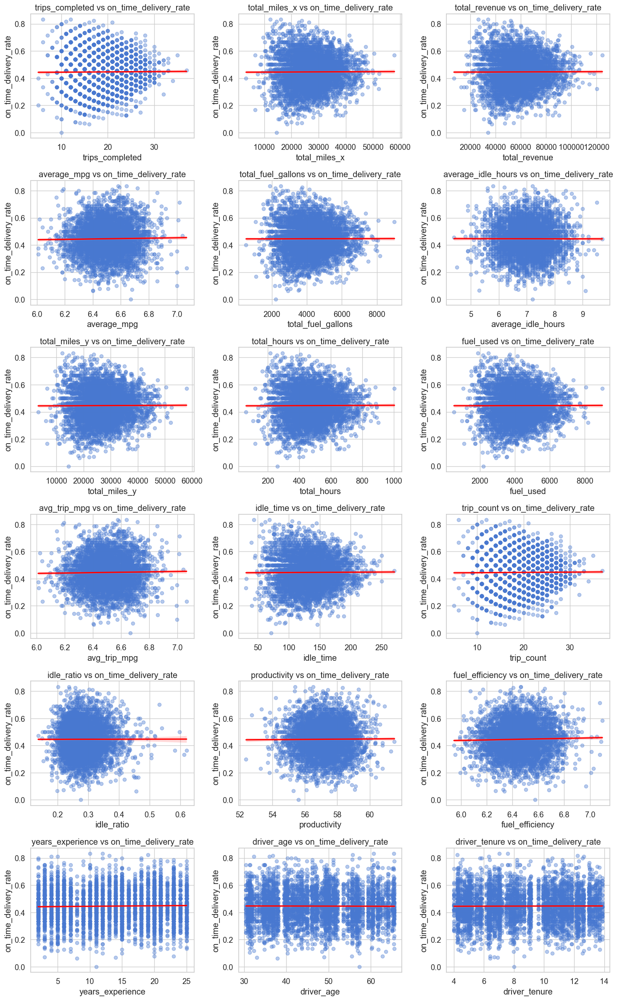

In [13]:
# Bivariate Analysis - Target vs Numerical features

target = "on_time_delivery_rate"

# Numerical columns except target
num_cols = data.select_dtypes(include=['float64', 'int64']).columns.tolist()
num_cols = [col for col in num_cols if col != target]

# 1. Correlation with target
corr_with_target = data[num_cols].corrwith(data[target]).sort_values(ascending=False)
print("\nCorrelation of numerical features with target:")
display(corr_with_target)

# 2. Heatmap around target column
plt.figure(figsize=(6, 10))
sns.heatmap(data[num_cols + [target]].corr()[[target]].sort_values(by=target, ascending=False),
            annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation of Numerical Features with Target")
plt.show()

# 3. Scatterplots with regression line
rows = (len(num_cols) + 2) // 3
plt.figure(figsize=(15, rows * 4))

for i, col in enumerate(num_cols):
    plt.subplot(rows, 3, i+1)
    sns.regplot(x=data[col], y=data[target], scatter_kws={'alpha':0.4}, line_kws={'color':'red'})
    plt.title(f"{col} vs {target}")

plt.tight_layout()
plt.show()


ther is no corelation exist between the target and the numarical columes

### Bivariate Analysis: Target vs Categorical Features

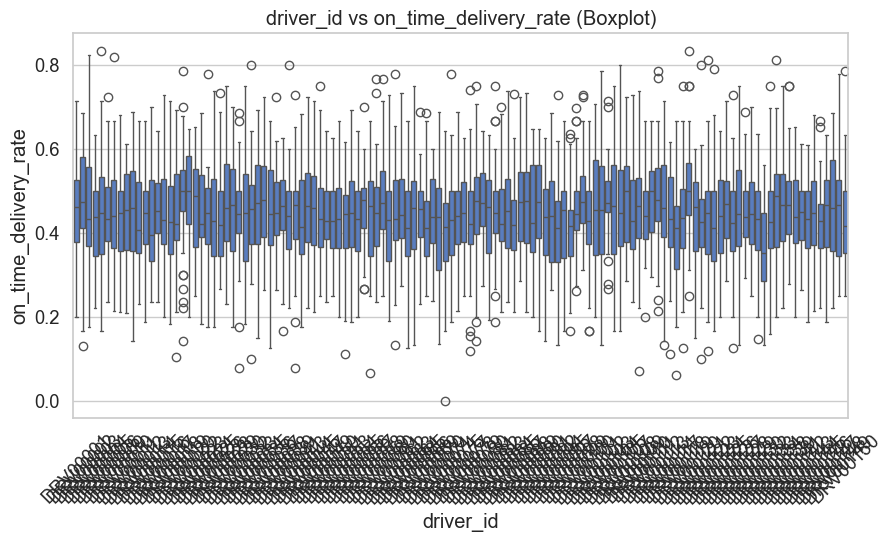

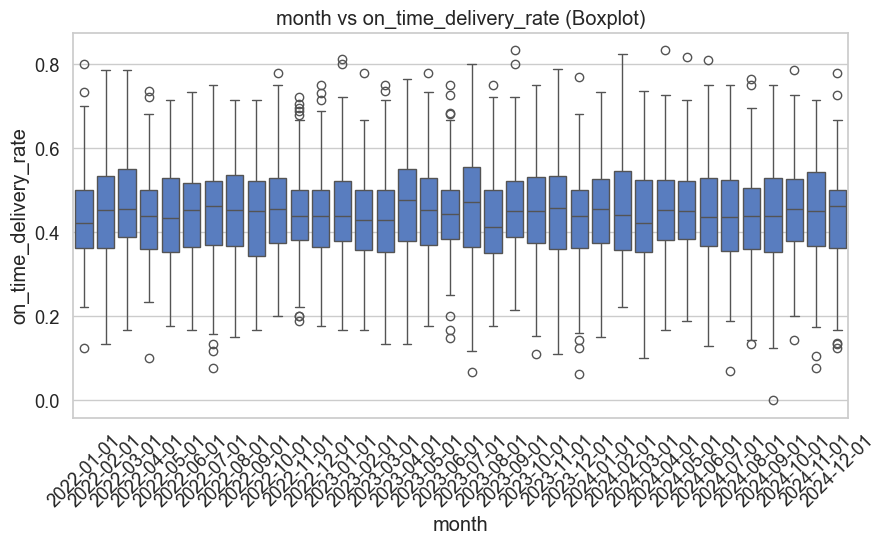

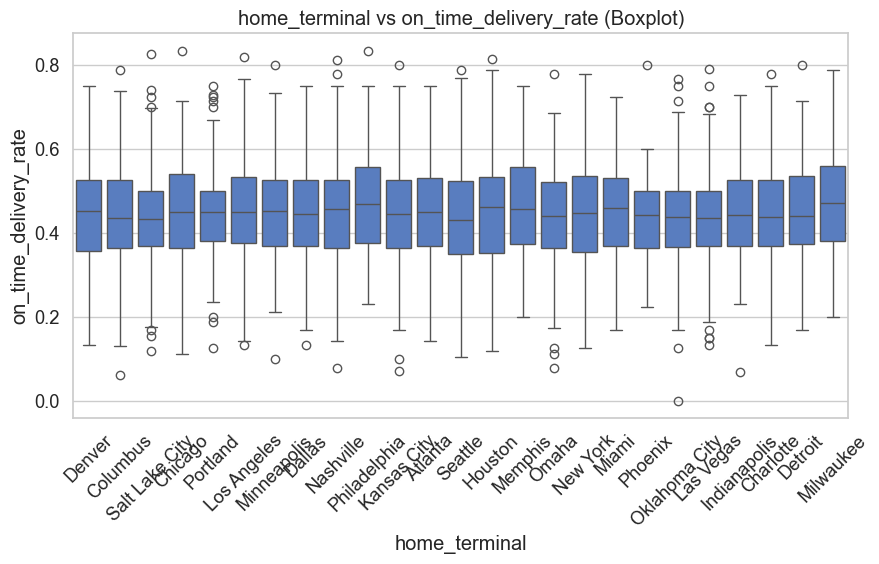

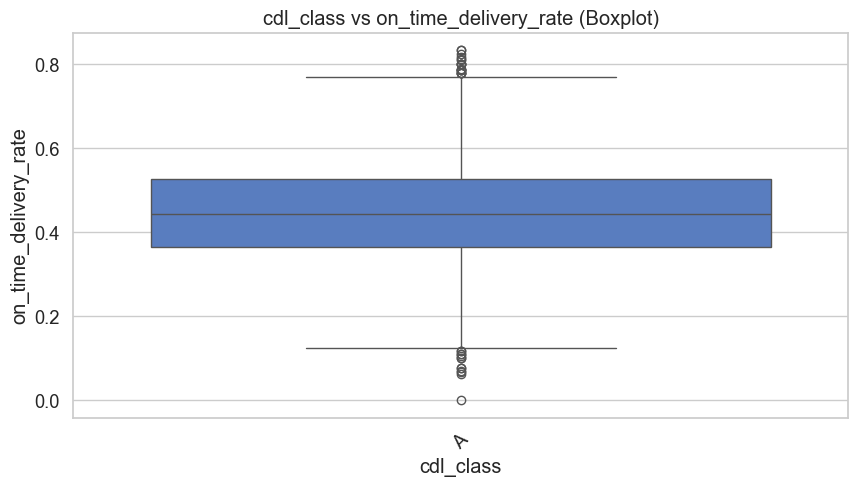

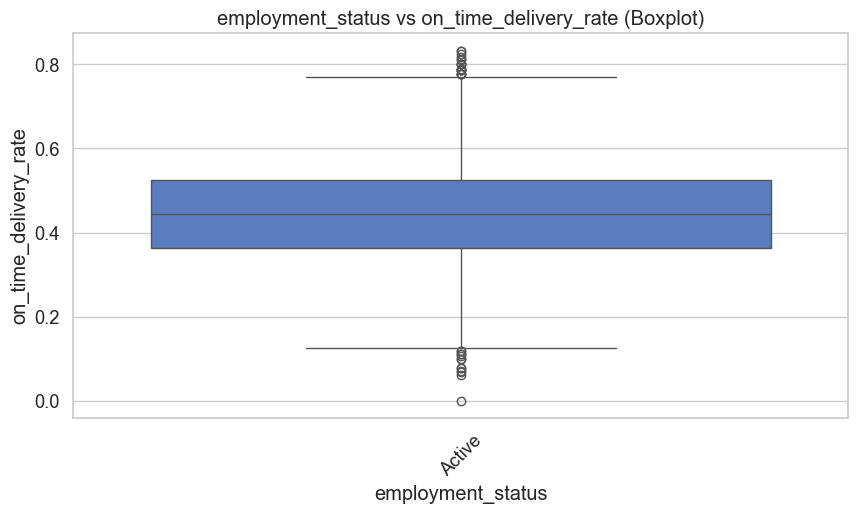

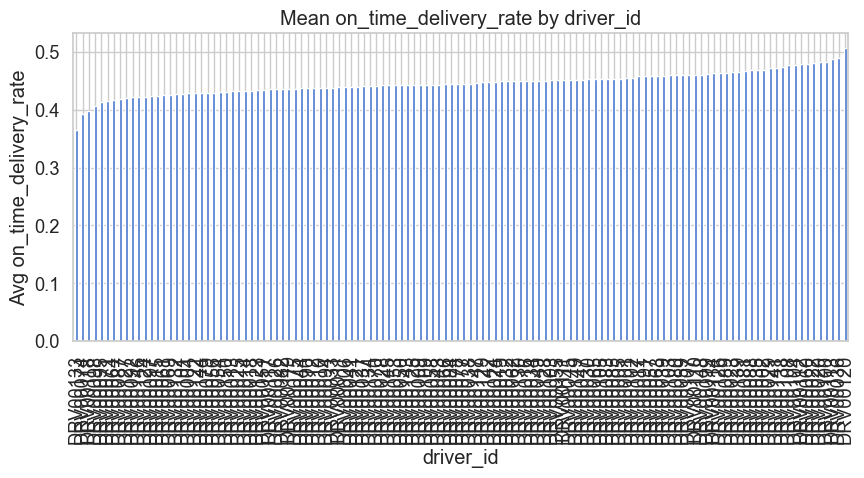

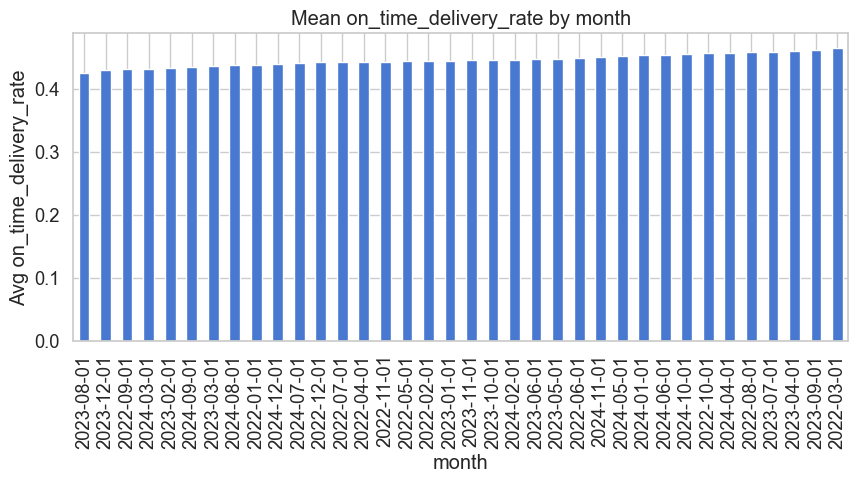

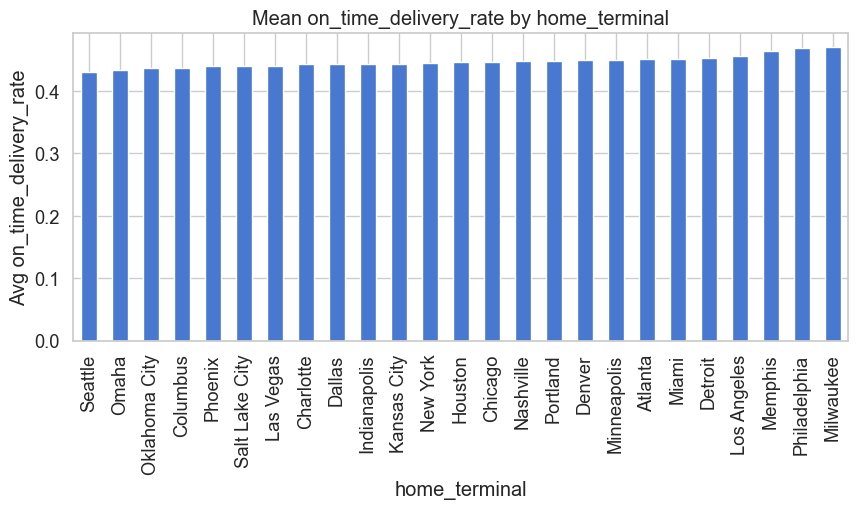

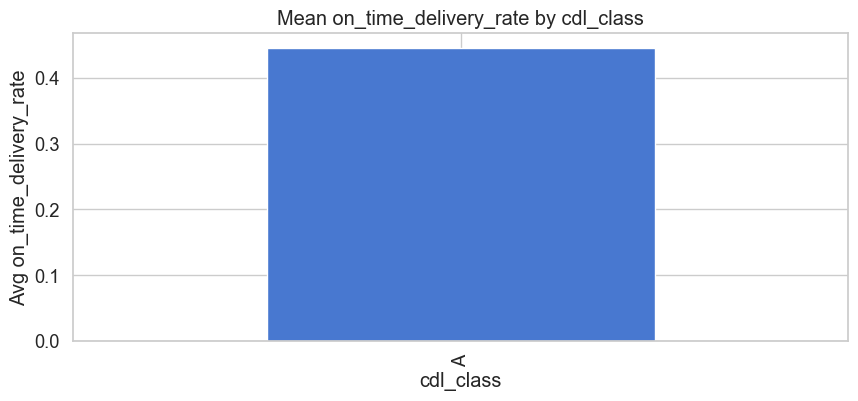

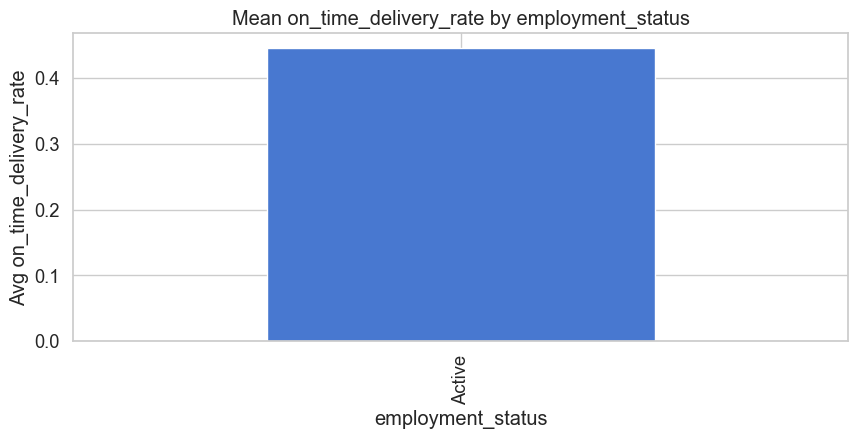

In [14]:
# Target vs Categorical features

cat_cols = data.select_dtypes(include=['object', 'category']).columns.tolist()

# Boxplots for each categorical column
for col in cat_cols:
    plt.figure(figsize=(10,5))
    sns.boxplot(x=data[col], y=data[target])
    plt.title(f"{col} vs {target} (Boxplot)")
    plt.xticks(rotation=45)
    plt.show()

# Mean Target Value by Category
for col in cat_cols:
    plt.figure(figsize=(10,4))
    data.groupby(col)[target].mean().sort_values().plot(kind='bar')
    plt.title(f"Mean {target} by {col}")
    plt.ylabel(f"Avg {target}")
    plt.show()


Among all categorical variables, only home_terminal shows noticeable impact on on_time_delivery_rate
Driver, month, CDL class, and employment status do not meaningfully influence the target and should be dropped or deprioritized.

## drop the useless columes 

In [15]:
drop_cols = ['driver_id', 'cdl_class', 'employment_status']
data_reduced = data.drop(columns=[c for c in drop_cols if c in data.columns]).copy()
print("Columns after drop:", data_reduced.columns.tolist())


Columns after drop: ['month', 'trips_completed', 'total_miles_x', 'total_revenue', 'average_mpg', 'total_fuel_gallons', 'on_time_delivery_rate', 'average_idle_hours', 'total_miles_y', 'total_hours', 'fuel_used', 'avg_trip_mpg', 'idle_time', 'trip_count', 'idle_ratio', 'productivity', 'fuel_efficiency', 'home_terminal', 'years_experience', 'driver_age', 'driver_tenure']


In [25]:
data_reduced.head().T

,0,1,2,3,4
month,2022-01-01,2022-02-01,2022-03-01,2022-04-01,2022-05-01
trips_completed,26,9,20,19,14
total_miles_x,36620,13515,30361,28127,16071
total_revenue,79141.59,27133.87,62399.62,68161.13,36256.82
average_mpg,6.61,6.69,6.36,6.61,6.35
total_fuel_gallons,5574.7,2095.1,4792.2,4251.4,2573.1
on_time_delivery_rate,0.385,0.333,0.55,0.474,0.214
average_idle_hours,8.2,6.8,7.5,8.4,6.8
total_miles_y,36620,13515,30361,28127,16071
total_hours,642.7,245.2,546.6,501.8,282.3


### Numerical vs Numerical (Multicollinearity Check)

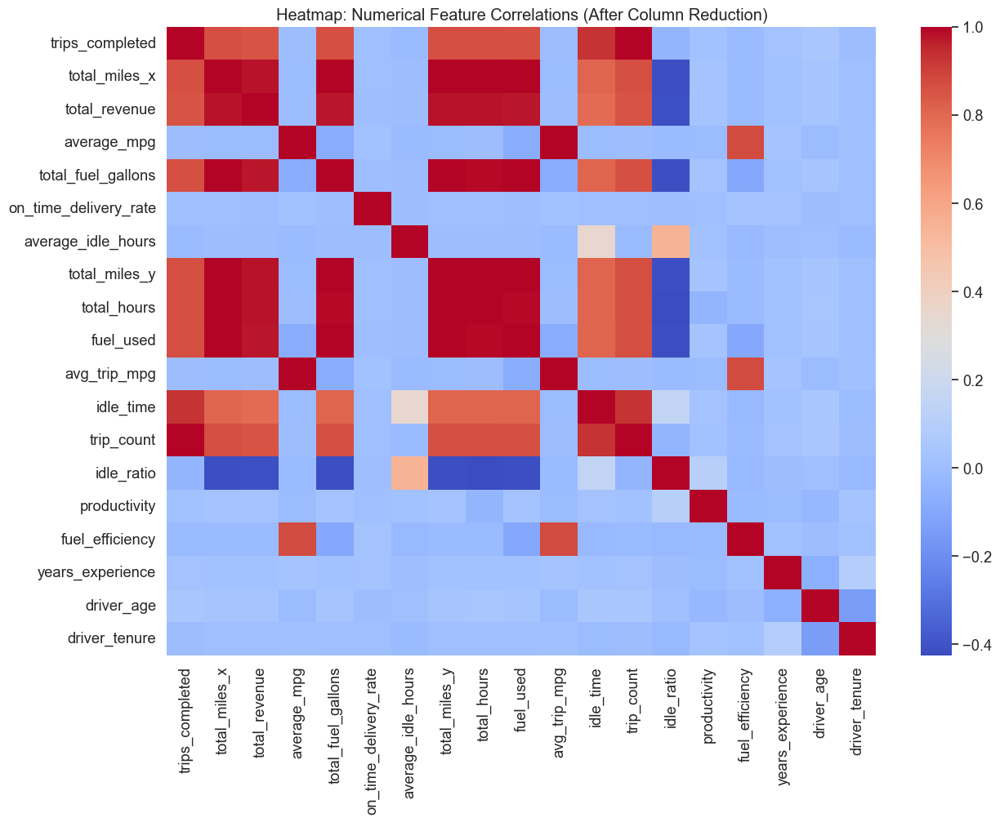

In [18]:
# Numerical vs Numerical (Correlation Matrix)

# numeric columns from data_reduced
num_cols_reduced = data_reduced.select_dtypes(include=['float64', 'int64']).columns.tolist()

plt.figure(figsize=(14,10))
sns.heatmap(data_reduced[num_cols_reduced].corr(), cmap="coolwarm", annot=False)
plt.title("Heatmap: Numerical Feature Correlations (After Column Reduction)")
plt.show()

The numerical feature correlation matrix shows strong multicollinearity among several operational metrics. Variables such as total_miles_x, total_miles_y, total_hours, total_revenue, fuel_used, and total_fuel_gallons are highly correlated with each other (correlation > 0.90), indicating that they represent the same underlying driver workload pattern. Similarly, trip_count and trips_completed are nearly identical, and average_mpg correlates strongly with avg_trip_mpg

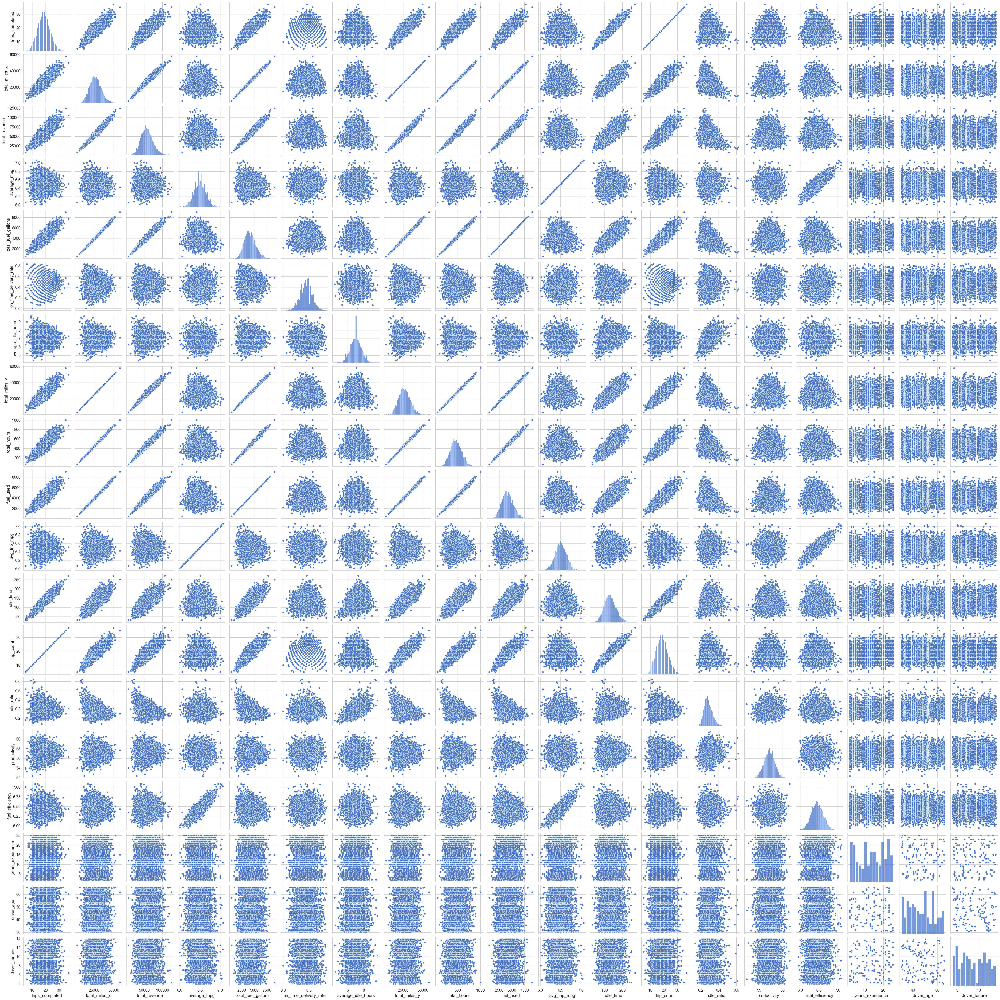

In [20]:
## Scatterplot matrix (pairplot) for a subset of numerical features
sampled_num_cols = num_cols_reduced[:]  # limit to first 5 for visibility
sns.pairplot(data_reduced[sampled_num_cols])
plt.show()

In [24]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm

# Step 1: Select reduced numeric features
selected_num_features = [
    'total_miles_x',
    'trip_count',
    'fuel_efficiency',
    'idle_time',
    'idle_ratio',
    'average_idle_hours',
    'productivity',
    'years_experience',
    'driver_age',
    'driver_tenure'
]

X_numeric = data_reduced[selected_num_features].copy()

# Step 2: Add constant for statsmodels VIF
X_numeric_const = sm.add_constant(X_numeric)

# Step 3: Compute VIF
vif_data = pd.DataFrame()
vif_data["feature"] = X_numeric_const.columns
vif_data["VIF"] = [variance_inflation_factor(X_numeric_const.values, i)
                   for i in range(X_numeric_const.shape[1])]

print(vif_data)

               feature          VIF
0                const  6024.339543
1        total_miles_x    32.115330
2           trip_count   121.979900
3      fuel_efficiency     1.002337
4            idle_time   113.177348
5           idle_ratio    11.398690
6   average_idle_hours    19.206207
7         productivity     1.156691
8     years_experience     1.014082
9           driver_age     1.028664
10       driver_tenure     1.031007


as we are doing the xgboost model it will handel the multicolinearity no need of removing the corelated features no we will train the model with out the removinh then we will remove the feure and we will try 

### Numerical vs Categorical (Distribution Behavior)

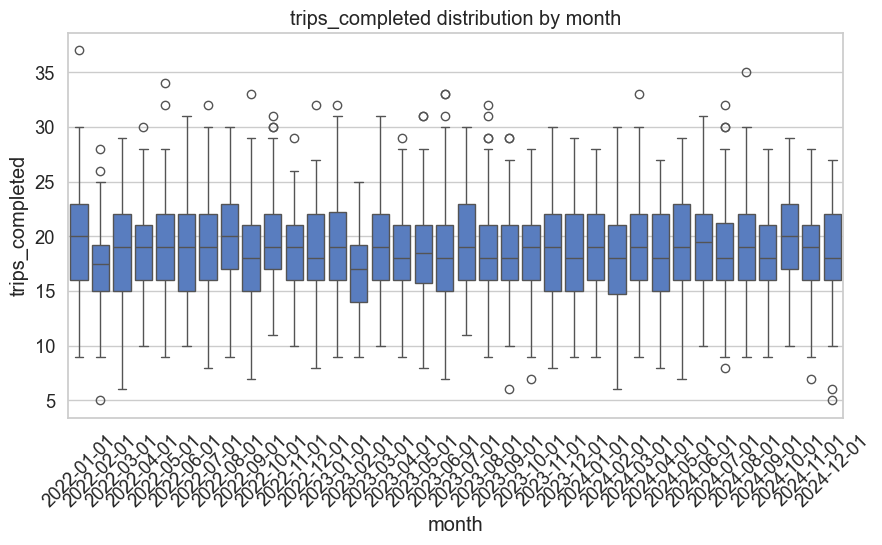

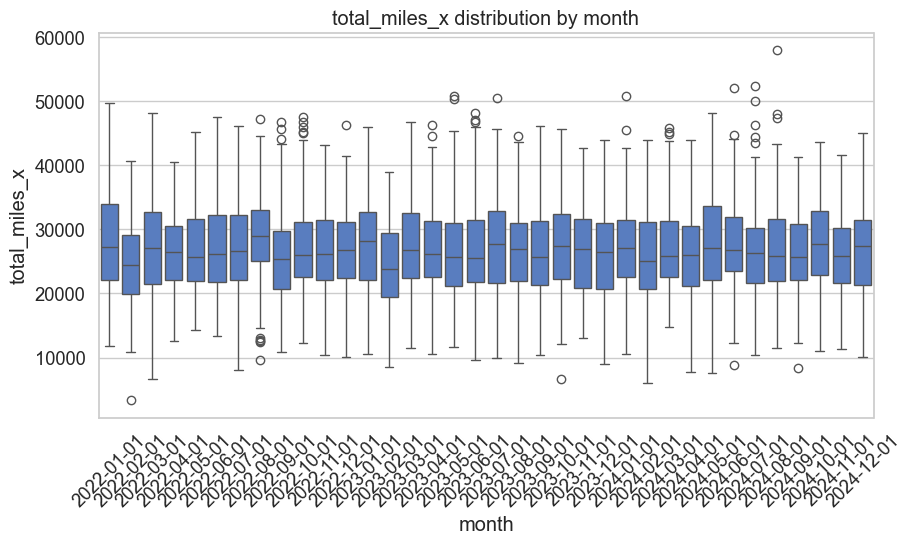

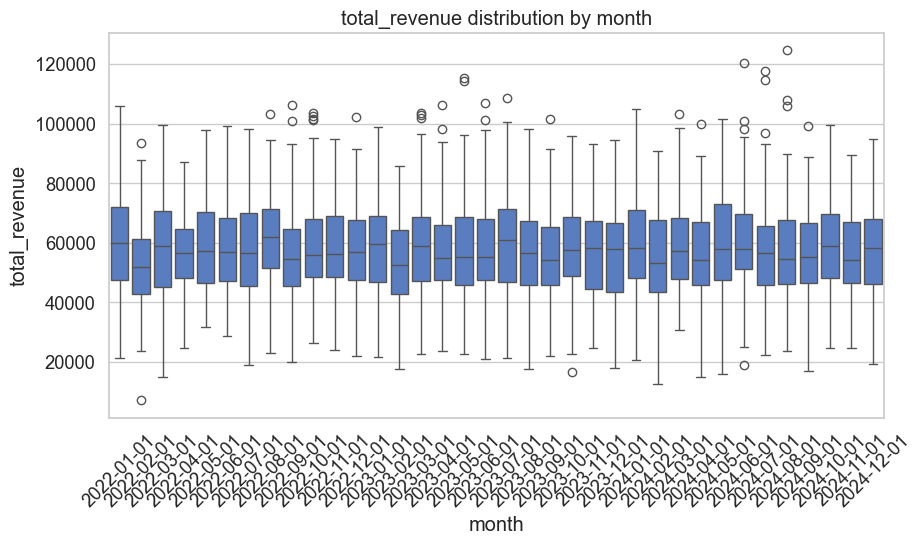

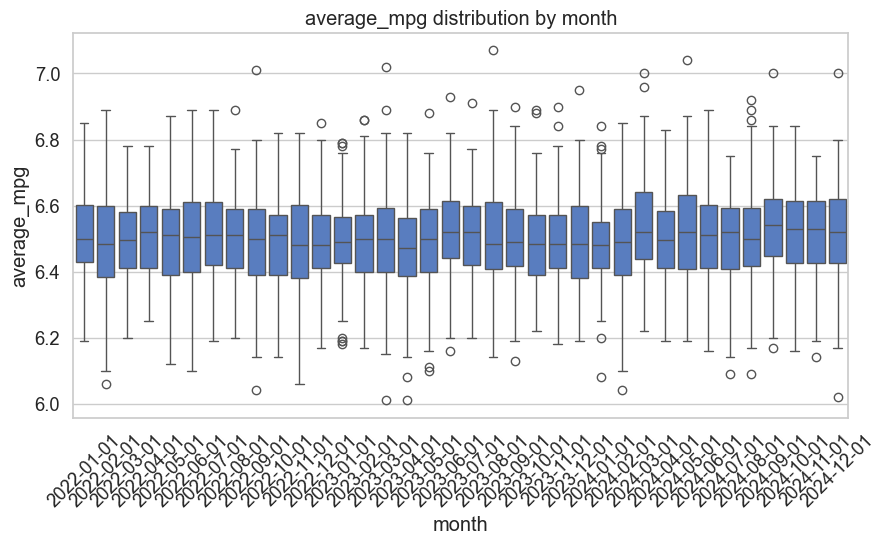

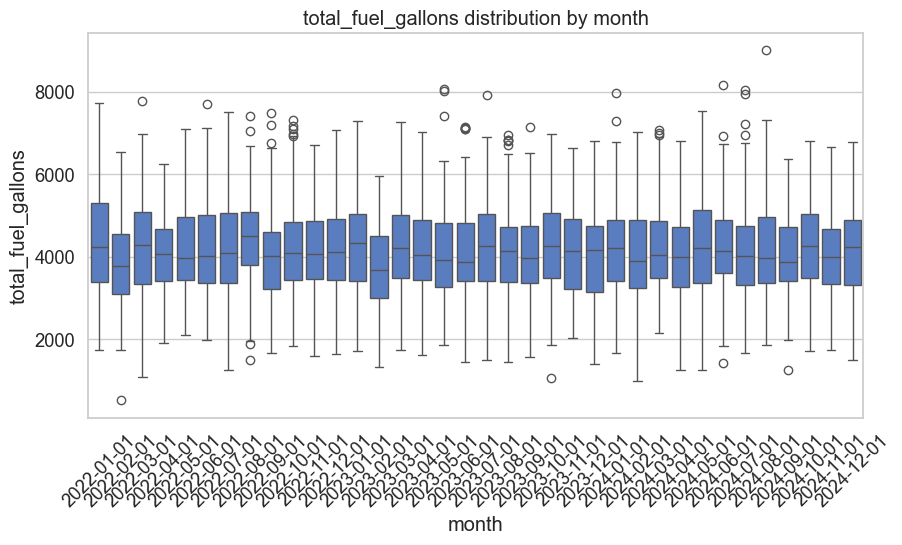

...

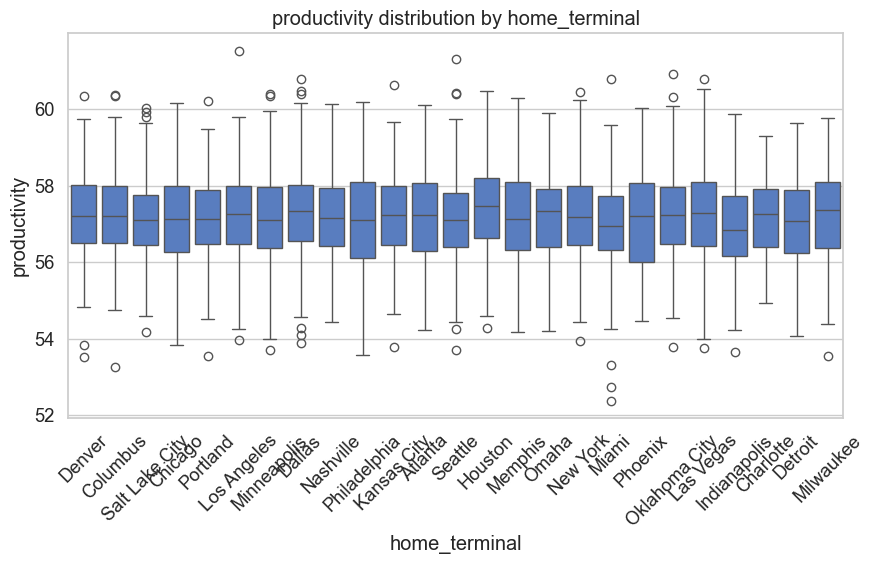

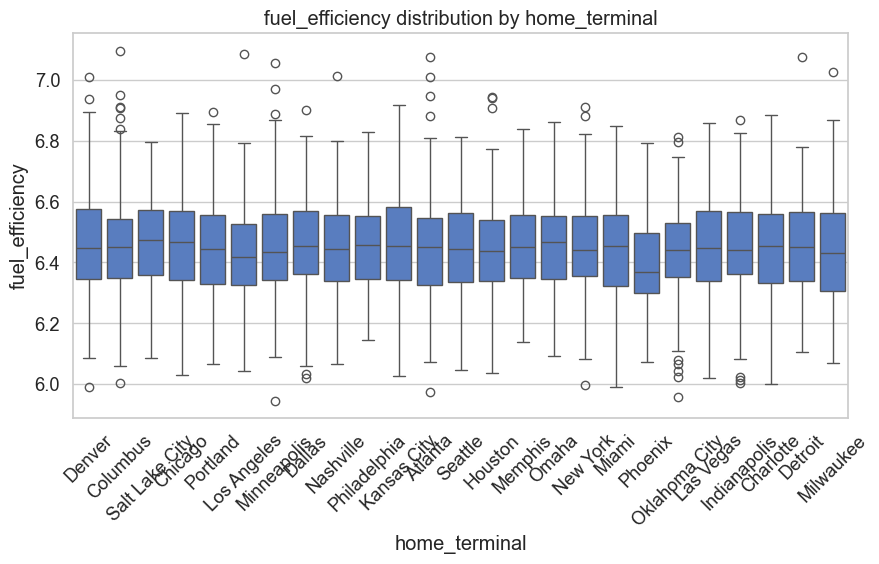

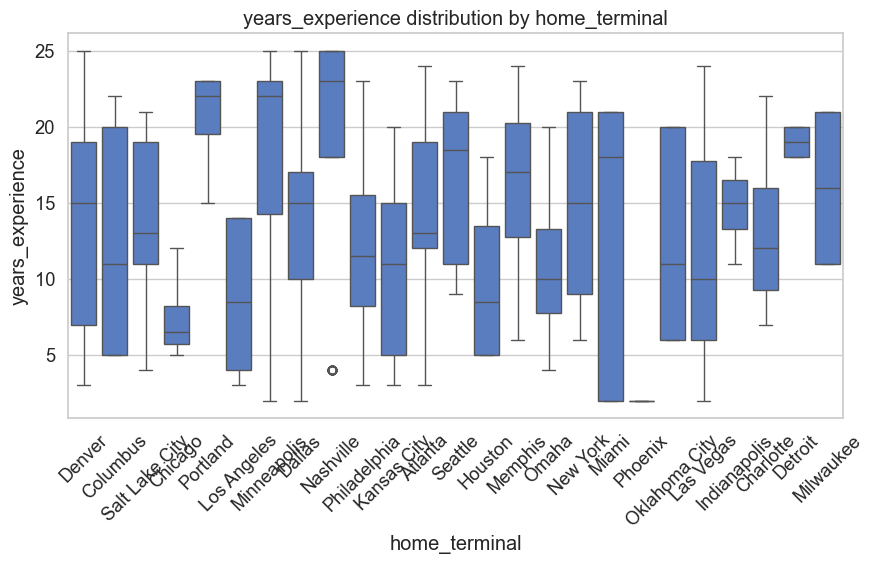

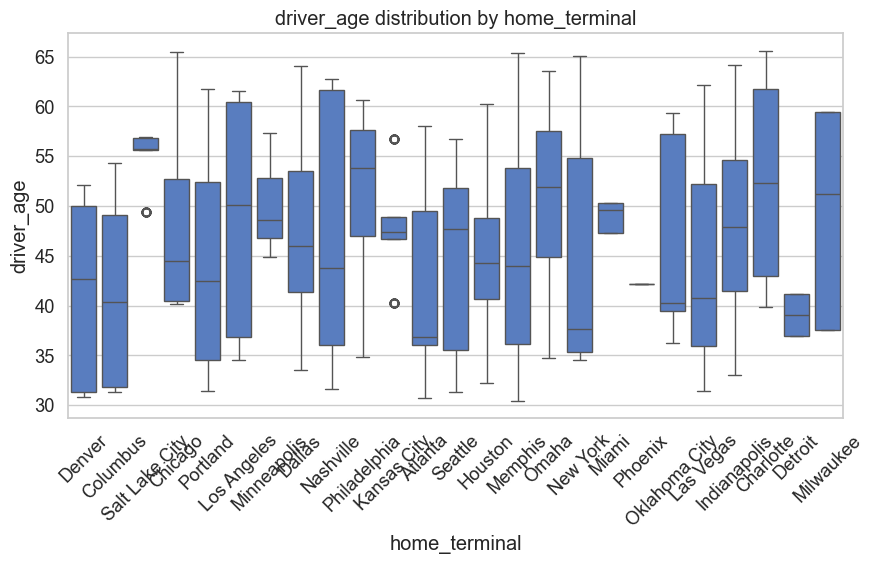

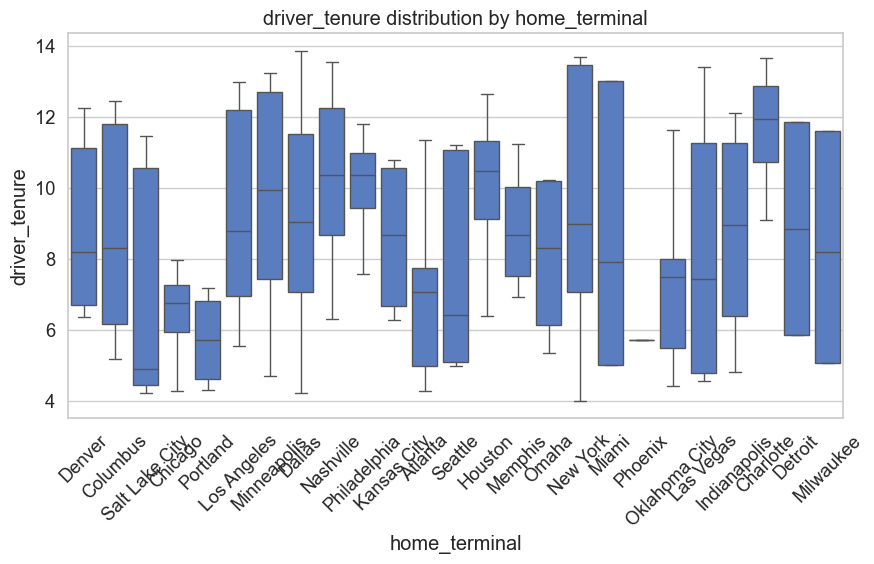

In [28]:
# Recalculate categorical columns after dropping useless columns
cat_cols_filtered = data_reduced.select_dtypes(include=['object']).columns.tolist()

# Remove driver_id, cdl_class, employment_status if still present
remove_cols = ['driver_id', 'cdl_class', 'employment_status']
cat_cols_filtered = [c for c in cat_cols_filtered if c not in remove_cols]

# Recalculate numeric columns
num_cols_filtered = data_reduced.select_dtypes(include=['int64', 'float64']).columns.tolist()
num_cols_filtered = [c for c in num_cols_filtered if c != 'on_time_delivery_rate']

# Now run the plots safely
for col in cat_cols_filtered:
    for num in num_cols_filtered:
        plt.figure(figsize=(10,5))
        sns.boxplot(x=data_reduced[col], y=data_reduced[num])
        plt.title(f"{num} distribution by {col}")
        plt.xticks(rotation=45)
        plt.show()


Month shows almost no variation across any numerical feature → weak predictor.

Home Terminal shows clear differences in miles, revenue, fuel use, idle time, and driver attributes → strong predictor.


Performance varies by terminal, not by month. Keep home_terminal as an important feature; month has minimal impact.

### 5 — Multivariate analysis

In [29]:
# ---------------------------
# CELL 5: Multivariate Analysis
# ---------------------------

import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Define target
target = "on_time_delivery_rate"

# Get numeric columns (excluding target)
num_cols = data_reduced.select_dtypes(include=['float64', 'int64']).columns.tolist()
num_cols = [col for col in num_cols if col != target]

# Compute correlation with target
num_vs_target = data_reduced[num_cols].corrwith(data_reduced[target])

# ---------------------------


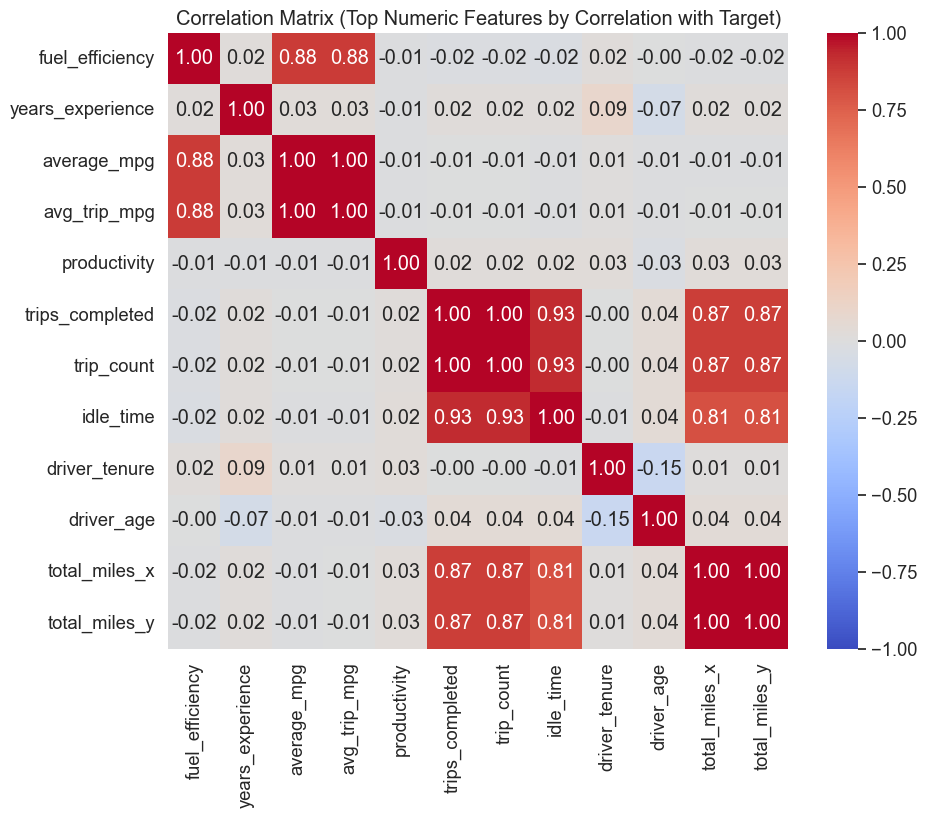

In [30]:
# 5.1 Correlation Heatmap (Top numeric features)
# ---------------------------

# Select top 12 features – even though correlations are small, this gives a structure
top_features = num_vs_target.abs().sort_values(ascending=False).head(12).index.tolist()

plt.figure(figsize=(10, 8))
sns.heatmap(data_reduced[top_features].corr(), annot=True, fmt=".2f",
            cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Correlation Matrix (Top Numeric Features by Correlation with Target)")
plt.show()



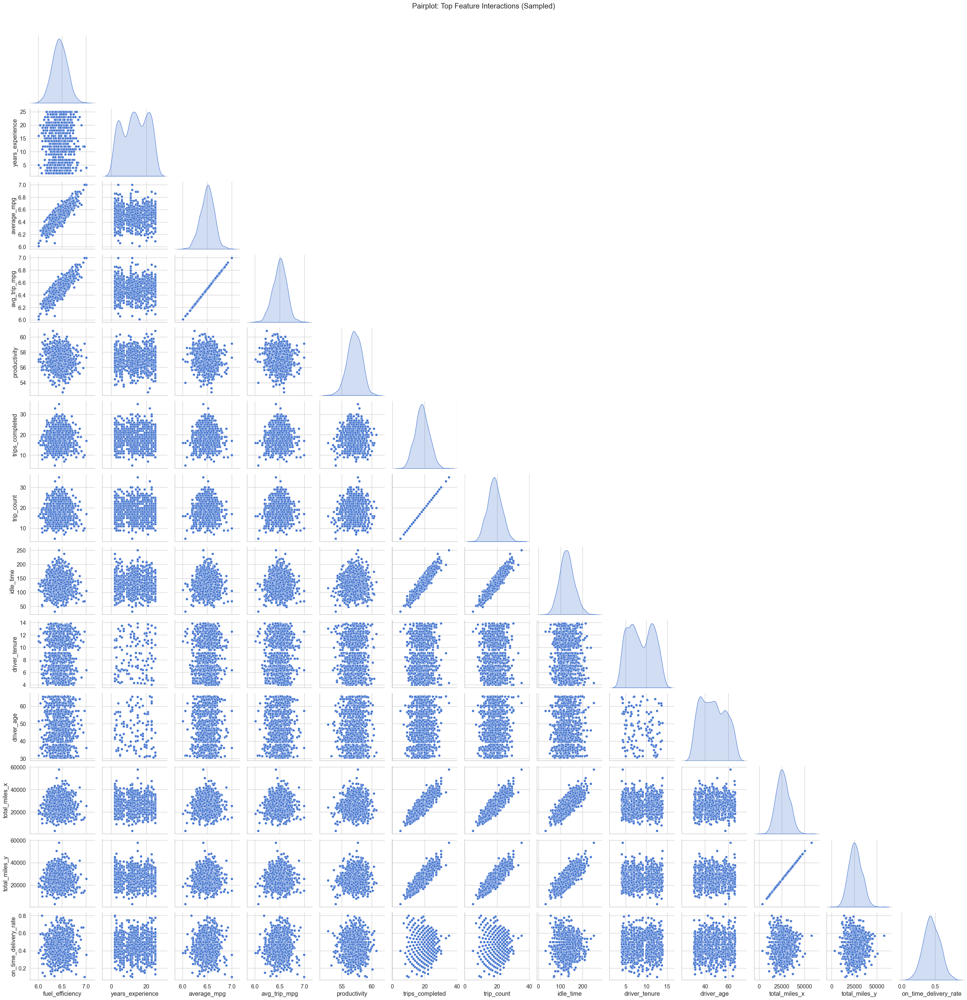

In [32]:
# ---------------------------
# 5.2 Pairplot (Sampled)
# ---------------------------

pair_subset = top_features[:]   # choose first 6 features
sample_df = data_reduced[pair_subset + [target]].dropna()

# Sample safely
if len(sample_df) > 1000:
    sample_df = sample_df.sample(n=1000, random_state=42)

sns.pairplot(sample_df, diag_kind='kde', corner=True)
plt.suptitle("Pairplot: Top Feature Interactions (Sampled)", y=1.02)
plt.show()



In [33]:
# ---------------------------
# 5.3 PCA Overview (Variance Explained)
# ---------------------------

# pca_cols = top_features
# Xp = data_reduced[pca_cols].dropna()

# Standardize before PCA
# scaler = StandardScaler().fit(Xp)
#X_scaled = scaler.transform(Xp)

# Fit PCA
#pca = PCA(n_components=min(len(pca_cols), 10))
#pca.fit(X_scaled)

#explained = pd.Series(pca.explained_variance_ratio_,
#                      index=[f"PC{i+1}" for i in range(len(pca.explained_variance_ratio_))])

#print("PCA Explained Variance Ratio:")
#display(explained.cumsum().to_frame("cumulative_explained_variance"))

# Plot explained variance
#plt.figure(figsize=(8, 4))
#explained.plot(kind='bar')
#plt.title("PCA: Explained Variance by Component")
#plt.ylabel("Explained Variance Ratio")
#plt.show()


# spliting te data into train test and the vlaidation 

In [34]:
from sklearn.model_selection import train_test_split

X = data_reduced.drop(columns=['on_time_delivery_rate'])
y = data_reduced['on_time_delivery_rate']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42
)

print("Train shape:", X_train.shape)
print("Test shape:", X_test.shape)


Train shape: (3571, 20)
Test shape: (893, 20)


# Encoding + Scaling setup

In [36]:
data_reduced.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4464 entries, 0 to 4463
Data columns (total 21 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   month                  4464 non-null   object 
 1   trips_completed        4464 non-null   int64  
 2   total_miles_x          4464 non-null   int64  
 3   total_revenue          4464 non-null   float64
 4   average_mpg            4464 non-null   float64
 5   total_fuel_gallons     4464 non-null   float64
 6   on_time_delivery_rate  4464 non-null   float64
 7   average_idle_hours     4464 non-null   float64
 8   total_miles_y          4464 non-null   int64  
 9   total_hours            4464 non-null   float64
 10  fuel_used              4464 non-null   float64
 11  avg_trip_mpg           4464 non-null   float64
 12  idle_time              4464 non-null   float64
 13  trip_count             4464 non-null   int64  
 14  idle_ratio             4464 non-null   float64
 15  prod

In [37]:
# Pre-check categorical cardinality
cat_cols = ['home_terminal', 'month']   
for c in cat_cols:
    n_unique = data_reduced[c].nunique()
    top_values = data_reduced[c].value_counts().head(10)
    print(f"{c}: {n_unique} unique values")
    print(top_values, "\n")


home_terminal: 25 unique values
home_terminal
Dallas           324
Minneapolis      288
Las Vegas        288
New York         252
Oklahoma City    252
Seattle          216
Nashville        216
Columbus         216
Los Angeles      216
Atlanta          180
Name: count, dtype: int64 

month: 36 unique values
month
2022-01-01    124
2022-02-01    124
2022-03-01    124
2022-04-01    124
2022-05-01    124
2022-06-01    124
2022-07-01    124
2022-08-01    124
2022-09-01    124
2022-10-01    124
Name: count, dtype: int64 



In [38]:
# Convert month to datetime
data_reduced['month'] = pd.to_datetime(data_reduced['month'])

# Extract month number (1–12)
data_reduced['month_num'] = data_reduced['month'].dt.month

# Extract year
data_reduced['year'] = data_reduced['month'].dt.year

# Drop original month column
data_reduced = data_reduced.drop(columns=['month'])

print("Month converted to month_num and year.")


Month converted to month_num and year.


In [39]:
data_reduced.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4464 entries, 0 to 4463
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   trips_completed        4464 non-null   int64  
 1   total_miles_x          4464 non-null   int64  
 2   total_revenue          4464 non-null   float64
 3   average_mpg            4464 non-null   float64
 4   total_fuel_gallons     4464 non-null   float64
 5   on_time_delivery_rate  4464 non-null   float64
 6   average_idle_hours     4464 non-null   float64
 7   total_miles_y          4464 non-null   int64  
 8   total_hours            4464 non-null   float64
 9   fuel_used              4464 non-null   float64
 10  avg_trip_mpg           4464 non-null   float64
 11  idle_time              4464 non-null   float64
 12  trip_count             4464 non-null   int64  
 13  idle_ratio             4464 non-null   float64
 14  productivity           4464 non-null   float64
 15  fuel

In [40]:
%pip install category_encoders


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


StandardScaler (zero mean, unit variance)

In [43]:
from category_encoders.target_encoder import TargetEncoder
from sklearn.model_selection import KFold

# K-Fold Target Encoder (safe)
target_enc = TargetEncoder(cols=['home_terminal'], smoothing=0.3)

# Fit only on training data
target_enc.fit(X_train['home_terminal'], y_train)

# Transform train & test
X_train['home_terminal_te'] = target_enc.transform(X_train['home_terminal'])
X_test['home_terminal_te']  = target_enc.transform(X_test['home_terminal'])

# Drop original column
X_train = X_train.drop(columns=['home_terminal'])
X_test  = X_test.drop(columns=['home_terminal'])

print("Target encoding applied to home_terminal.")


KeyError: 'home_terminal'

In [ ]:
from sklearn.preprocessing import StandardScaler

num_cols = [c for c in X_train.columns if X_train[c].dtype in ['int64','float64'] and c != 'on_time_delivery_rate']
scaler = StandardScaler().fit(X_train[num_cols])   # fit on train only

X_train_scaled = scaler.transform(X_train[num_cols])
X_test_scaled  = scaler.transform(X_test[num_cols])
